## Vehicle Detection Project

The goals / steps of this project are the following:

- Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
- Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.
- Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
- Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
- Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
- Estimate a bounding box for vehicles detected.

In [1]:
import os
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
import pickle

from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

Two useful functions to save time once a good classifier is found:

In [2]:
def save_model(model, scaler):
    """
    Pickles the model and save it to file system.
    """
    with open('classifier.pkl', 'wb') as fp:
        data = {
            'model': model,
            'scaler': scaler
        }
        pickle.dump(data, fp)

def load_model():
    """
    Loads an existing trained model.
    """
    with open('classifier.pkl', 'rb') as fp:
        data = pickle.load(fp)
    return data['model'], data['scaler']

## Load data

In [3]:
def load_images(basedir):
    """
    Images are divided up into vehicles and non-vehicles folders, 
    each of which contains subfolders. Different folders represent 
    different sources for images (eg. GTI, kitti, generated by me,...).
    """
    image_types = os.listdir(basedir)
    res = []
    for imtype in image_types:
      res.extend(glob.glob(basedir + imtype + '/*'))
    return res

cars = load_images('./vehicles/')
print('Number of vehicle images found: {}'.format(len(cars)))

notcars = load_images('./non-vehicles/')
print('Number of non-vehicle images found: {}'.format(len(notcars)))

searchpath = 'images_video/vehicle_det_examples/*'
example_images = glob.glob(searchpath)
print('Number of example images: {}'.format(len(example_images)))

Number of vehicle images found: 8792
Number of non-vehicle images found: 8968
Number of example images: 8


## Visualization utils

On the next 3 blocks of code there're functions used along the project to visualize, color space convertion and drawing boxes.

In [4]:
def visualize(fig, rows, cols, imgs, titles):
    """
    Function for plotting multiple images.
    """
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        plt.title(i + 1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
        else:
            plt.imshow(img)
        plt.title(titles[i])

In [5]:
def convert_color(img, conv='RGB2YCrCb'):
    """
    Function to convert an image from a 
    space color to another one.
    """
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    elif conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    elif conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    elif conv == 'HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    elif conv == 'LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    elif conv == 'HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    elif conv == 'YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    elif conv == 'YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)

In [6]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    """
    Function to draw bounding boxes
      1. Make a copy of the image.
      2. Iterate through the bounding boxes and draw a 
         rectangle given bbox coordinates.
      3. Return the image copy with boxes drawn.
    """
    imcopy = np.copy(img)
    for bbox in bboxes:
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    return imcopy

## Feature extraction

In order to detect our objects of interest, we need to know what differentiates them from the rest of the image. Things like colors and gradients can be good differentiators but lets give them an identity. All of these potential characteristics are features that we could use. What features are more important may depend upon the appearance of the objects in question.

In most applications, we'll end up using a combination of features that give the best results.

### Histogram of Oriented Gradients (HOG)

I use a combination of spatial binning, histogram of colors and HOG features. HOG features in particular are extracted using skimage.feature.hog function at method get_hog_features. The following set of functions are used to perform some extractions and calculus from a given image:

In [7]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                     vis=False, feature_vec=True):
    """
    Function to return HOG features and visualization.
    
    Call with two outputs if vis==True, otherwise call with one output
    
    The histogram of oriented gradients (HOG) is a feature 
    descriptor used in computer vision and image processing 
    for the purpose of object detection. The technique counts 
    occurrences of gradient orientation in localized portions 
    of an image. This method is similar to that of edge 
    orientation histograms, scale-invariant feature transform 
    descriptors, and shape contexts, but differs in that it is 
    computed on a dense grid of uniformly spaced cells and uses 
    overlapping local contrast normalization for improved accuracy.
    
    Source: https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients
    """
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [8]:
def bin_spatial(img, size=(32, 32)):
    """
    Function to compute binned color features.
    It takes an image, a color space, and a new image size
    and returns a feature vector
    """
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

In [9]:
def color_hist(img, nbins=32):
    """
    Function to compute the color histogram features:    
     1. Compute the histogram of the RGB channels separately.
     2. Concatenate the histograms into a single feature vector.
     3. Return the individual histograms, bin_centers and feature vector.
    """
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features

I started by applying the features extraction from one image from the provided dataset. Here is the function to extract features from one image and an example of one of each of the vehicle and non-vehicle classes:

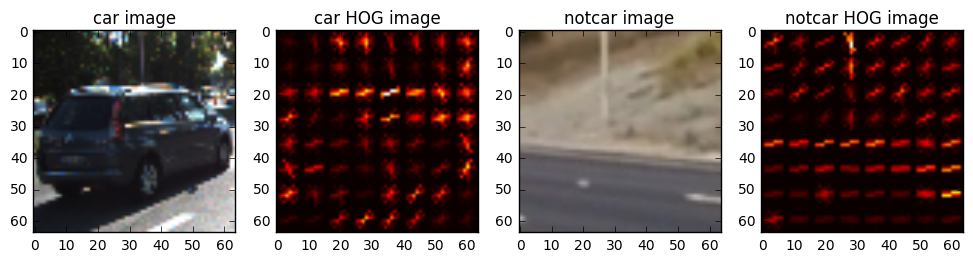

In [10]:
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True,
                        vis=False):    
    """
    Function to extract features from a single image window:
      1. Define an empty list to receive features
      2. Apply color conversion if other than 'RGB'
      3. Compute spatial features if flag is set
      4. Compute histogram features if flag is set    
      5. Compute HOG features if flag is set
      6. Return concatenated array of features    
    """
    img_features = []
    
    if color_space != 'RGB':
        feature_image = convert_color(img, color_space)
    else: 
        feature_image = np.copy(img)      

    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        img_features.append(spatial_features)

    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        img_features.append(hist_features)

    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        img_features.append(hog_features)

    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)
    
def test_single_img_features():
    """
    Test feature extraction from a single image:
      1. Choose random car & not-car indices.
      2. Read in car & notcar images.
      3. Define feature parameters.
      4. Extract the features for car & not-car.
      5. Visualize them.
    """
    %matplotlib inline

    car_ind = np.random.randint(0, len(cars))
    notcar_ind = np.random.randint(0, len(notcars))

    car_image = mpimg.imread(cars[car_ind])
    notcar_image = mpimg.imread(notcars[notcar_ind])

    color_space = 'YCrCb'  # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 9  # HOG orientations
    pix_per_cell = 8  # HOG pixels per cell
    cell_per_block = 2  # HOG cells per block
    hog_channel = 0  # Can be 0,1,2, or "ALL"
    spatial_size = (32, 32)  # spatial binning dimensions
    hist_bins = 16  # number of histogram bins
    spatial_feat = True  # Spatial features on or off
    hist_feat = True  # Histogram features on or off
    hog_feat = True  # HOG features on or off

    car_features, car_hog_image = single_img_features(car_image, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
    notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

    images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
    titles = ['car image', 'car HOG image', 'notcar image', 'notcar HOG image']
    fig = plt.figure(figsize=(12, 3)) 
    visualize(fig, 1, 4, images, titles)
        
test_single_img_features()

## Classification model

Now that we've extracted suitable features from an image, let's use them to detect cars.

A classic approach is to first design a classifier that can differentiate car images from non-car images, and then run that classifier across an entire frame sampling small patches along the way. 

First of all, I defined a function to extract features from a list of images, based on the previous one.

In [11]:
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32), hist_bins=32, 
                     orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=True, hist_feat=True, hog_feat=True):
    """
    Extract the features of a list of images.
    """
    features = []
    for file in imgs:
        image = mpimg.imread(file)
        img_features = single_img_features(image, color_space, spatial_size,
                        hist_bins, orient, 
                        pix_per_cell, cell_per_block, hog_channel,
                        spatial_feat, hist_feat, hog_feat, vis=False)
            
        features.append(img_features)
    return features

### Defining the classifier using the selected HOG features and color features.

To create the classifier, I trained a linear SVM using a combination of spatial, color histogram and HOG features. The classifier does the following:

1. Collects training data and extracts features using `extract_features`.
2. Normalizes data using `sklearn.preprocessing.StandardScaler`.
3. Splits data into train/test set using sklearn.model_selection.train_test_split, and
4. Creates a LinearSVC model.
5. train and computes accuracy on test set.
6. Returns the model and the scaler.

In [12]:
def train_model(color_space='YCrCb', spatial_size=(32, 32), hist_bins=32, orient=9, 
                pix_per_cell=8, cell_per_block=2, hog_channel=0,
                spatial_feat=True, hist_feat=True, hog_feat=True,
                n_samples=0):
    """
    Function to train a SVC classifier from extracted features of images.
    
        1. Collects training data and extracts features using `extract_features`.
        2. Normalizes data using `sklearn.preprocessing.StandardScaler`.
        3. Splits data into train/test set using sklearn.model_selection.train_test_split, and
        4. Creates a LinearSVC model.
        5. train and computes accuracy on test set.
        6. Returns the model and the scaler.
    """
    t = time.time()
    if n_samples > 0:
        test_cars = np.array(cars)[np.random.randint(0, len(cars), n_samples)]
        test_notcars = np.array(notcars)[np.random.randint(0, len(notcars), n_samples)]
    else:
        test_cars = cars
        test_notcars = notcars

    car_features = extract_features(test_cars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    notcar_features = extract_features(test_notcars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    t_features = time.time() - t

    # Normalize features
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    X_scaler = StandardScaler().fit(X)
    scaled_X = X_scaler.transform(X)

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

    # Split up data into randomized training and test sets
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2)

    # Use a linear SVC and train
    svc = LinearSVC()
    t = time.time()
    svc.fit(X_train, y_train)
    t_training = round(time.time() - t, 2)
    
    # computes the accuracy
    accuracy = round(svc.score(X_test, y_test), 4)
    
    print('color:{}'.format(color_space), 'spatial_size:', spatial_size, 
          'orient:{}, hog:{}, hist:{}, feat:{}, time: {}s, acc: {}'.format(
            orient, hog_channel, hist_bins, 
            len(X_train[0]), 
            t_training, accuracy))

    return svc, X_scaler

### The final choice of HOG parameters.

In the next block of code there's a test function that executes the training/evaluation process for the linear SVC model. The functions uses a sample of 1000 images, and iterates within different combinations of orientations (9, 12), colorspaces (RGB, YCrCb), hist_bins (16, 32), spatial_sizes (16x16 and 32x32) and HOG channels (0, ALL). 

In [13]:
def test_train_model():
    print("Test training model...")
    for color_space in ['RGB', 'YCrCb']:
        for spatial_size in [(16, 16), (32, 32)]:
            for hist_bins in [16, 32]:
                for orient in [9, 12]:
                    for hog_channel in [0,'ALL']:
                        train_model(color_space=color_space, spatial_size=spatial_size, 
                                hist_bins=hist_bins, orient=orient, 
                                pix_per_cell=8, cell_per_block=2, hog_channel=hog_channel,
                                spatial_feat=True, hist_feat=True, hog_feat=True, n_samples=1000)
test_train_model()

Test training model...
color:RGB spatial_size: (16, 16) orient:9, hog:0, hist:16, feat:2580, time: 2.82s, acc: 0.9625
color:RGB spatial_size: (16, 16) orient:9, hog:ALL, hist:16, feat:6108, time: 6.23s, acc: 0.98
color:RGB spatial_size: (16, 16) orient:12, hog:0, hist:16, feat:3168, time: 3.65s, acc: 0.9575
color:RGB spatial_size: (16, 16) orient:12, hog:ALL, hist:16, feat:7872, time: 9.28s, acc: 0.9525
color:RGB spatial_size: (16, 16) orient:9, hog:0, hist:32, feat:2628, time: 2.7s, acc: 0.9675
color:RGB spatial_size: (16, 16) orient:9, hog:ALL, hist:32, feat:6156, time: 6.67s, acc: 0.97
color:RGB spatial_size: (16, 16) orient:12, hog:0, hist:32, feat:3216, time: 3.28s, acc: 0.95
color:RGB spatial_size: (16, 16) orient:12, hog:ALL, hist:32, feat:7920, time: 8.95s, acc: 0.965
color:RGB spatial_size: (32, 32) orient:9, hog:0, hist:16, feat:4884, time: 5.06s, acc: 0.965
color:RGB spatial_size: (32, 32) orient:9, hog:ALL, hist:16, feat:8412, time: 8.91s, acc: 0.9625
color:RGB spatial_size

Finally following values were used (to optimize accuracy and training time):
```
    color_space='YCrCb'
    spatial_size = (16, 16)
    hist_bins = 32
    hist_range = (0, 256)
    orient = 12
    pix_per_cell = 8
    cell_per_block = 2
    hog_channel = 'ALL'
```

Here we initialize the model to be used in the next steps:

In [14]:
if not os.path.exists('classifier.pkl'):
    model, scaler = train_model(color_space='YCrCb', spatial_size=(16, 16), hist_bins=32, orient=12, 
                            pix_per_cell=8, cell_per_block=2, hog_channel='ALL', spatial_feat=True, 
                            hist_feat=True, hog_feat=True, n_samples=0)
    save_model(model, scaler)
else:
    model, scaler = load_model()

## Detection - Sliding window search

Sliding window is implemented by slide_window. The method takes start and stop positions in both x and y, the window size (x and y dimensions), and overlap fraction (for both x and y). Returns  all possible windows to search for cars. 

Following default values are used:
```
    x_start_stop=[None, None]
    y_start_stop=[400, 656] 
    xy_window=(64, 64)
    xy_overlap=(0.5, 0.5)
```

In [15]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[400, 656], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    """
    This function takes an image, start and stop positions in both x and y, 
    window size (x and y dimensions), and overlap fraction (for both x and y)
    """
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]

    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1
    
    # Initialize a list to append window positions to
    window_list = []
    
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))

    return window_list

In [16]:
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):
    """
    Given an image and the list of windows to be 
    searched (output of slide_windows()),
    returns windows for positive detections:
      
    Foreach window in list:
        1. Extract the test window from original image
        2. Extract features for that window using single_img_features()
        3. Scale extracted features to be fed to classifier.
        4. Predict using your classifier.
        5. If positive (prediction == 1) then save the window.
    """
    on_windows = []
    for window in windows:        
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        prediction = clf.predict(test_features)
        if prediction == 1:
            on_windows.append(window)
            
    return on_windows

To find a good size for the bounding boxes, to accommodate cars, I prepared a test function to play with different paramenters, and have a guidance for the size. In the next blocks, there are some of the tests. The bests results are obtained with a size of 96px.

Testing with window size: (128, 128)


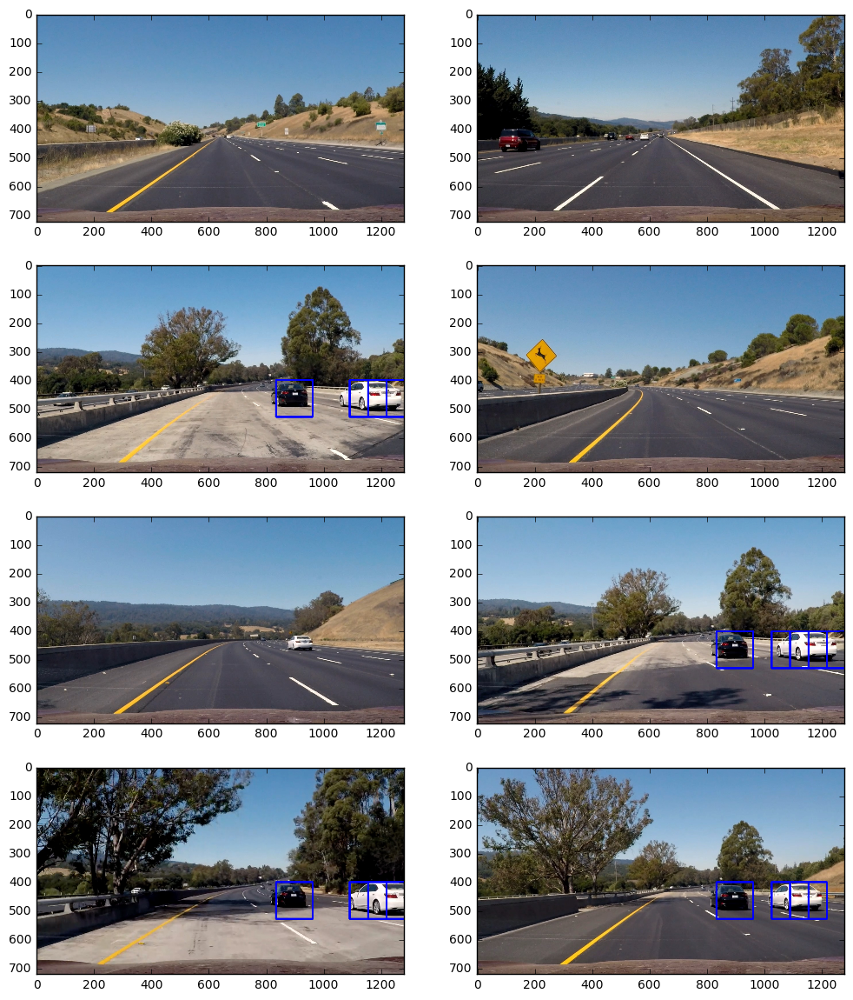

In [17]:
def test_slide_window(example_images, model, scaler, xy_window=(128, 128), xy_overlap=(0.5, 0.5),
                      color_space='YCrCb', spatial_size=(16, 16), hist_bins=32, 
                      orient=12, pix_per_cell=8, cell_per_block=2, hog_channel='ALL', 
                      spatial_feat=True, hist_feat=True, hog_feat=True):

    print("Testing with window size:", xy_window)
    images = []
    titles = []

    for img_src in example_images:
        t1 = time.time()
        img = mpimg.imread(img_src)
        draw_img = np.copy(img)

        img = img.astype(np.float32) / 255

        windows = slide_window(img, xy_window=xy_window, xy_overlap=xy_overlap)

        hot_windows = search_windows(img, windows, model, scaler, color_space=color_space, 
                                spatial_size=spatial_size, hist_bins=hist_bins, 
                                orient=orient, pix_per_cell=pix_per_cell, 
                                cell_per_block=cell_per_block, 
                                hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                hist_feat=hist_feat, hog_feat=hog_feat)                       

        window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)                    
        images.append(window_img)
        titles.append('')
        # print(time.time() - t1, 'seconds to process one image searching', len(windows), 'windows')

    fig = plt.figure(figsize=(12, 18), dpi=300)
    visualize(fig, 5, 2, images, titles);

test_slide_window(example_images, model, scaler, xy_window=(128, 128), xy_overlap=(0.5, 0.5))

Testing with window size: (96, 96)


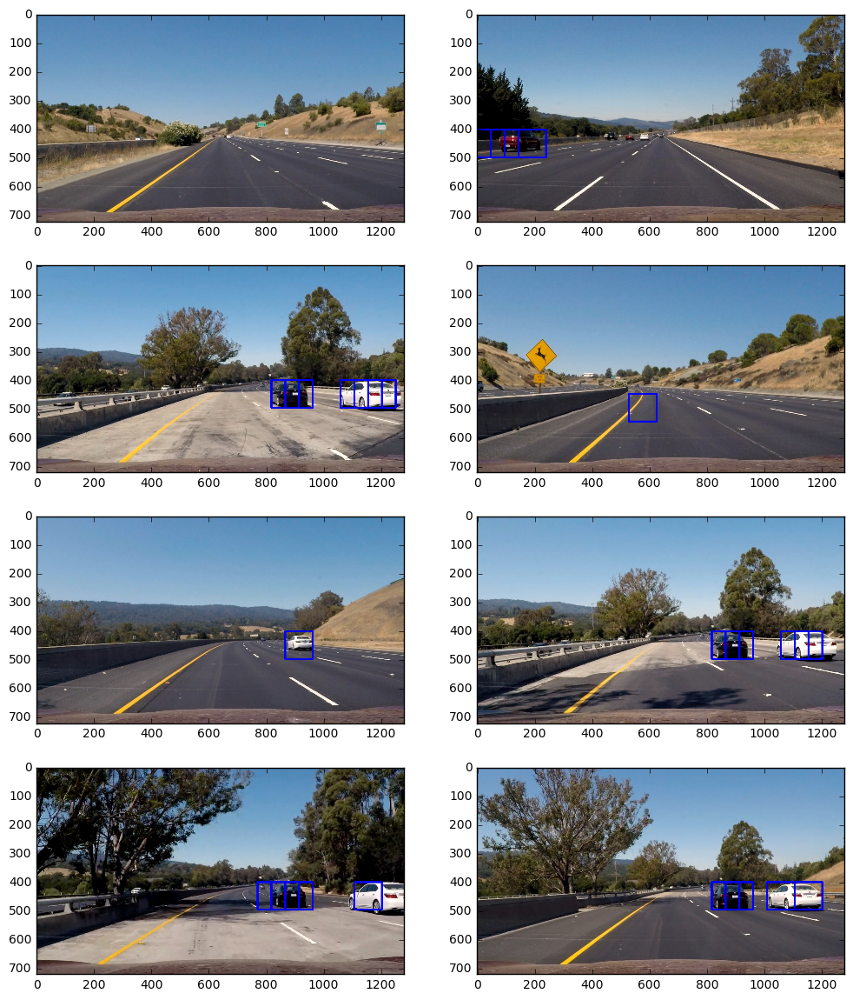

In [18]:
test_slide_window(example_images, model, scaler, xy_window=(96, 96), xy_overlap=(0.5, 0.5))

Testing with window size: (64, 64)


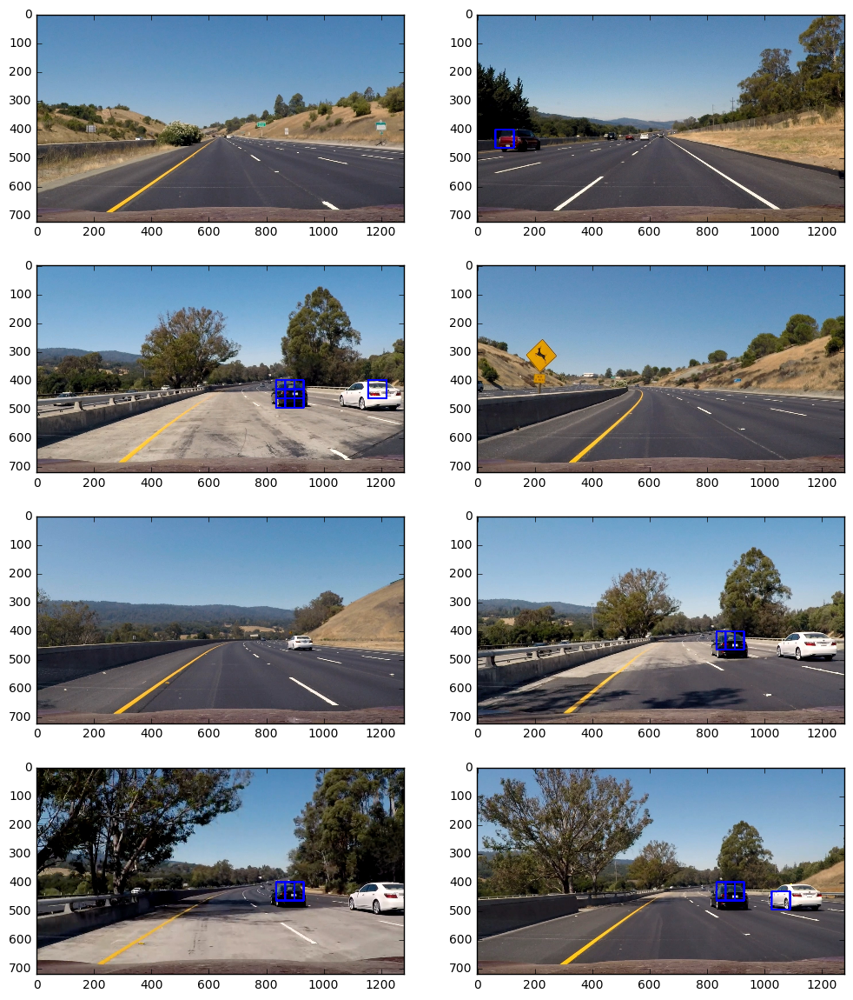

In [19]:
test_slide_window(example_images, model, scaler, xy_window=(64, 64), xy_overlap=(0.5, 0.5))

#### Show some examples of test images to demonstrate how your pipeline is working. How did you optimize the performance of your classifier?

The function `find_cars`, uses all the previous methods and parameters to detect cars in an image. The function does the following:

1. Extracts features (spatial binning + histogram of colors + HOG)
2. Instead of using multi scale windows, it uses a fixed size window and a rescaled image to detect boxes that can possibly have cars in them.
3. Creates heatmap and thresholds it to minimize false positives and remove duplicate detections.

To test different parameters, I've defined the function `test_find_cars`, and I've done several tests to evaluate them. This notebook have 3 of them, using scales of 1, 1.5 and 2 to ilustrate the differences.

Testing Find Cars...


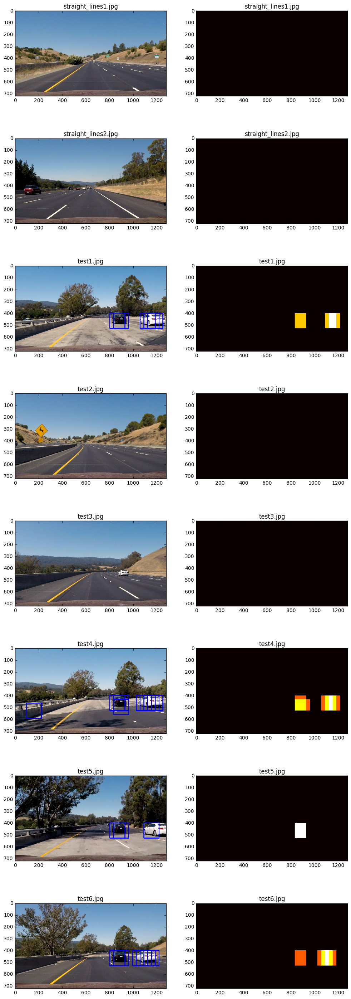

In [20]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def find_cars(img, ystart, ystop, scale, 
              spatial_size=(16, 16), hist_bins=32, orient=12, 
              pix_per_cell=8, cell_per_block=2):
    """
    Function to detect cars in images. It uses approaches from 
    the previous functions and methodologies, and some improvements
    are introduced:
      1. Instead of using different window sizes we're resizing the whole image.
      2. Compute individual channel HOG features for the entire image, 
         once rather than computing for small portions of the image.
      3. It creates a heatmap image based on the prediction boxes.
    """
    draw_img = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32) / 255
    img_boxes = []
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient * cell_per_block ** 2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2  # instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # Sliding window implementation
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb * cells_per_step
            xpos = xb * cells_per_step

            # extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos + nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos + nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos + nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell
            
            #extract the image patch
            subimg = cv2.resize(
                ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], 
                (64, 64)
            )
            
            # get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # scale features and make a prediction
            test_features = scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1,-1))
            test_prediction = model.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft * scale)
                ytop_draw = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                cv2.rectangle(draw_img, 
                              (xbox_left, ytop_draw + ystart), 
                              (xbox_left + win_draw, ytop_draw + ystart + win_draw),
                              (0,0,255), 6)
                img_boxes.append((
                              (xbox_left, ytop_draw + ystart),
                              (xbox_left + win_draw, ytop_draw + ystart + win_draw)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart,
                       xbox_left:xbox_left+win_draw] += 1

    return draw_img, heatmap, img_boxes

def test_find_cars(example_images, ystart=400, ystop=656, scale=1.5):
    print("Testing Find Cars...")
    out_images = []
    out_maps = []
    out_titles = []
    out_boxes = []
    
    for img_src in example_images:
        t = time.time()
        count = 0
        img = mpimg.imread(img_src)
        draw_img, heatmap, img_boxes = find_cars(img, ystart, ystop, scale)
        out_images.append(draw_img)
        title = img_src.split('/')[-1]
        out_titles.append(title)
        heatmap = apply_threshold(heatmap, 1)
        out_images.append(heatmap)
        out_titles.append(title)
        out_maps.append(heatmap)
        out_boxes.append(img_boxes)

    fig = plt.figure(figsize=(12, 36))
    visualize(fig, 8, 2, out_images, out_titles)

test_find_cars(example_images, 400, 656, 2.0)

Testing Find Cars...


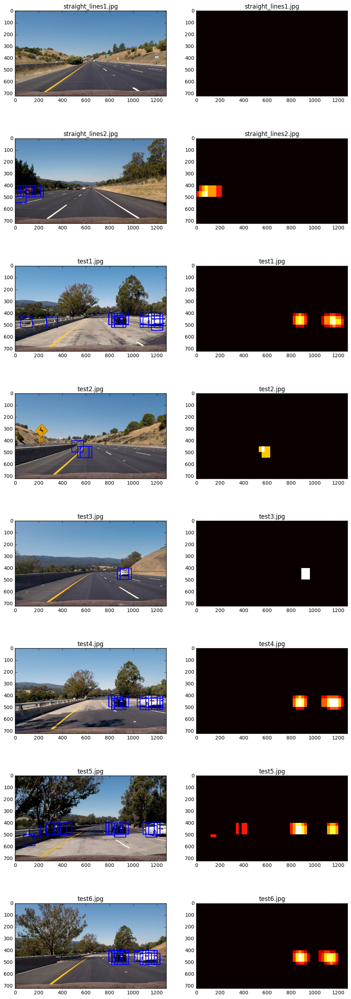

In [21]:
test_find_cars(example_images, 400, 656, 1.5)

Testing Find Cars...


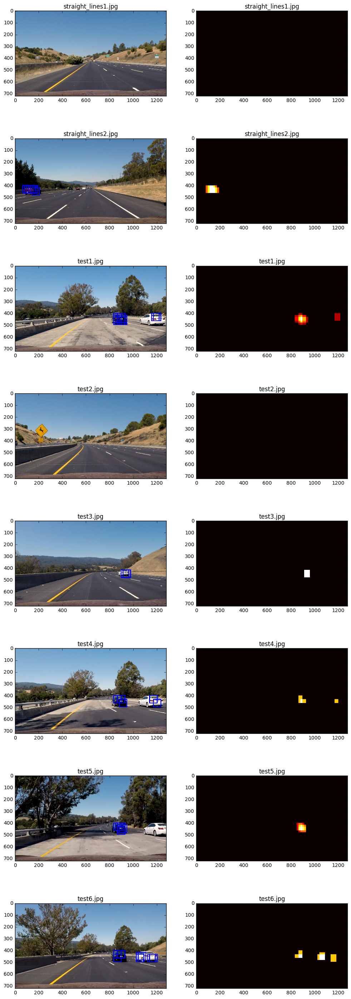

In [22]:
test_find_cars(example_images, 400, 656, 1.0)

NOTE: A scale of 1.5 performs better. (64*1.5 = 96, the window size with better results)

Testing Draw Labeled BBoxes...


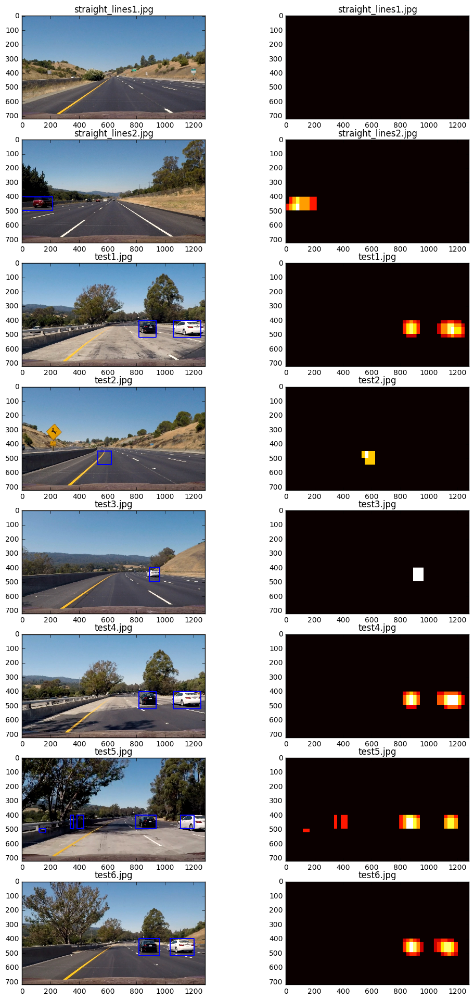

In [23]:
from scipy.ndimage.measurements import label

def draw_labeled_bboxes(image, labels):
    """
    Given an image and a list of detected cars, the
    function iterates through all detected cars:
      1. Find pixels with each car_number label value.
      2. Identify x and y values of those pixels.
      3. Define a bounding box based on min/max x and y.
      4. Draw the box on the image.
    Returns a copy of the image with bounding boxes.
    """
    img = np.copy(image)
    for car_number in range(1, labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    return img

def test_draw_labeled_bboxes(images, ystart=400, ystop=656, scale=1.5):
    print("Testing Draw Labeled BBoxes...")
    out_images = []
    out_maps = []
    out_titles = []

    for img_src in images:
        img = mpimg.imread(img_src)
        out_img, heatmap, _ = find_cars(img, ystart, ystop, scale)
        heatmap = apply_threshold(heatmap, 1)
        labels = label(heatmap)
        draw_img = draw_labeled_bboxes(img, labels)
        out_images.append(draw_img)
        out_images.append(heatmap)
        title = img_src.split('/')[-1]
        out_titles.append(title)
        out_titles.append(title)

    fig = plt.figure(figsize=(12,24))
    visualize(fig, 8, 2, out_images, out_titles)

test_draw_labeled_bboxes(example_images, 400, 656, 1.5)

## Pipeline on a video stream

At this point, I needed the camera calibration from the [Project 4](https://github.com/mpuig/CarND-Advanced-Lane-Lines), so I copied the `camera.py` file and the `mtx_dist.p` file with transformation matrix. With those files, I can use a `Camera` variable inside the `process_image` function to apply the distortion correction at each video frame.

Once the image is corrected, I can locate cars and apply the labeled boxes on top of each.

In [41]:
from collections import deque

class VideoProcessor():
    """
    Quick and dirty class toprocess each video frame.
    It uses other functions from the previous blocks of code
    in this notebook.
    """
    def __init__(self):
        self.frame_number = 0
        self._heatmaps = deque(maxlen=5)
        
    def process_image(self, img):
        """
        Find vehicles into it, given an undistorted image.
        """
        out_img, heatmap, _ = find_cars(img, 400, 656, 1.5)
        self._heatmaps.append(heatmap)
        
        if len(self._heatmaps) < 5:
            return img

        # Calculate the average of the last heatmaps
        heatmaps = np.sum(np.array(self._heatmaps), axis=0).astype(np.float32)
        heatmaps = apply_threshold(heatmaps, 4)
        labels = label(heatmaps)
        draw_img = draw_labeled_bboxes(img, labels)
        
        return draw_img

# Create an instance of the videoProcessor, to be used 
# in the process_image function
video_processor = VideoProcessor()

def process_image(img):
    """
    Function to process a frame of the video.
    It returns the image with overlayed boxes on detected cars.
    """
    draw_img = video_processor.process_image(img)
    return draw_img

from moviepy.editor import VideoFileClip
from IPython.display import HTML

# clip = VideoFileClip("./test_video.mp4")
# output_video = "./test_video_out.mp4"
clip = VideoFileClip("./project_video.mp4")
output_video = "./project_video_out.mp4"
output_clip = clip.fl_image(process_image)
output_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video ./project_video_out.mp4
[MoviePy] Writing video ./project_video_out.mp4






  0%|          | 0/1261 [00:00<?, ?it/s]



  0%|          | 1/1261 [00:00<07:18,  2.88it/s]



  0%|          | 2/1261 [00:00<07:14,  2.90it/s]



  0%|          | 3/1261 [00:01<07:09,  2.93it/s]



  0%|          | 4/1261 [00:01<07:11,  2.91it/s]



  0%|          | 5/1261 [00:01<08:46,  2.38it/s]



  0%|          | 6/1261 [00:02<08:26,  2.48it/s]



  1%|          | 7/1261 [00:02<08:48,  2.37it/s]



  1%|          | 8/1261 [00:03<08:35,  2.43it/s]



  1%|          | 9/1261 [00:03<08:23,  2.49it/s]



  1%|          | 10/1261 [00:03<08:12,  2.54it/s]



  1%|          | 11/1261 [00:04<08:09,  2.56it/s]



  1%|          | 12/1261 [00:04<07:59,  2.60it/s]



  1%|          | 13/1261 [00:05<07:46,  2.67it/s]



  1%|          | 14/1261 [00:05<07:38,  2.72it/s]



  1%|          | 15/1261 [00:05<07:44,  2.68it/s]



  1%|▏         | 16/1261 [00:06<07:46,  2.67it/s]



  1%|▏         | 17/1261 [00:06<08:01,  2.58it/s]



  1%|▏         | 18/1261 [00:06<07:49,  2.65it/s]



  2%|▏ 

[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_out.mp4 



In [42]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))

#### Briefly discuss any problems / issues you faced in your implementation of this project. Where will your pipeline likely fail? What could you do to make it more robust?

The greatest challenge I faced during this project was minimizing the amount of false positives, and there are still some fragments of the video which the 5 frame threshold on the heatmap didn't make it.

The final video is [project_video_out.mp4](project_video_out.mp4)

To make it more robust, I would add the use of previous detected boxes to the pipeline. Another improvement would be to change the classifier and play with parameters (for example a CNN).

I would also review the performance of the whole process, looking for better approaches on the sliding windows processes. A possible approach would be to use the previous boxes to limit the region to look for detections.

Finally, as I did in the [previous project](https://github.com/mpuig/CarND-Advanced-Lane-Lines), I would like to convert all the code to a more pythonic structure, encapsulating functions into classes, and having a cleaner code to be used independently of this notebook. But _tempus fugit_.